# **Анализ лиц и система извлечения признаков для генерации шаржей**

Данный ноутбук реализует:
- Извлечение 468 точек лица через MediaPipe
- Вычисление параметрических признаков (лоб, брови, глаза, нос, рот, скулы, челюсть и тд)
- Сравнение со средним лицом из выборки
- Генерацию вектора преувеличения для шаржей
- Применение варп-функции для составления карты признаков для ControlNet
- Визуализацию результатов

## Импорт библиотек

In [1]:
import numpy as np
import cv2
import json
import os
import random
from typing import List, Dict, Tuple, Optional
import mediapipe as mp
from tqdm import tqdm
import matplotlib.pyplot as plt
import warnings
import urllib.request
warnings.filterwarnings('ignore')

# Импорты для нового API MediaPipe
from mediapipe.tasks import python
from mediapipe.tasks.python import vision
# для визуализации лэндмарков по группам
from mediapipe.python.solutions import face_mesh as mp_face_mesh
import mediapipe.python.solutions.face_mesh as mp_face_mesh

## Первичный анализ

In [2]:
def create_image_grid(
    data_path: str, 
    n_rows: int, 
    n_cols: int, 
    cell_size: tuple[int, int] = (256, 256)
) -> np.ndarray:
    """
    Создает единое изображение-сетку размером n_rows x n_cols из случайных картинок датасета.
    
    :param data_path: Путь к папке с изображениями (например, 'data/Humans')
    :param n_rows: Количество строк в сетке
    :param n_cols: Количество колонок в сетке
    :param cell_size: Размер (ширина, высота) к которому будут приводиться изображения
    :return: Сформированный NumPy массив (картинка сетки)
    """
    # Поддерживаемые расширения файлов
    valid_extensions = ('.jpg', '.jpeg', '.png', '.webp', '.bmp')
    
    # Собираем все файлы картинок из папки
    if not os.path.exists(data_path):
        raise FileNotFoundError(f"Папка с датасетом не найдена по пути: {data_path}")
        
    all_images = [
        os.path.join(data_path, f) for f in os.listdir(data_path) 
        if f.lower().endswith(valid_extensions)
    ]
    
    if not all_images:
        raise ValueError(f"В папке '{data_path}' нет подходящих изображений.")
        
    total_needed = n_rows * n_cols
    
    # Выбираем случайные картинки (разрешаем повторения, если картинок в папке меньше, чем мест в сетке)
    if len(all_images) >= total_needed:
        selected_paths = random.sample(all_images, total_needed)
    else:
        selected_paths = random.choices(all_images, k=total_needed)
        
    # Читаем и ресайзим выбранные изображения
    processed_cells = []
    w, h = cell_size
    
    for path in selected_paths:
        img = cv2.imread(path)
        if img is None:
            # Если файл поврежден, создаем вместо него черный заглушечный квадрат
            img = np.zeros((h, w, 3), dtype=np.uint8)
        else:
            img = cv2.resize(img, (w, h))
        processed_cells.append(img)
        
    # Формируем строки сетки
    rows = []
    for i in range(n_rows):
        # Вырезаем пачку картинок для одной строки
        start_idx = i * n_cols
        end_idx = start_idx + n_cols
        row_cells = processed_cells[start_idx:end_idx]
        
        # Склеиваем картинки в строке по горизонтали (ось X)
        row = np.hstack(row_cells)
        rows.append(row)
        
    # Склеиваем все строки по вертикали (ось Y)
    grid = np.vstack(rows)
    
    return grid

In [3]:
def get_root_dir(path: str) -> str:
    return os.path.join(os.path.abspath(".."), path)

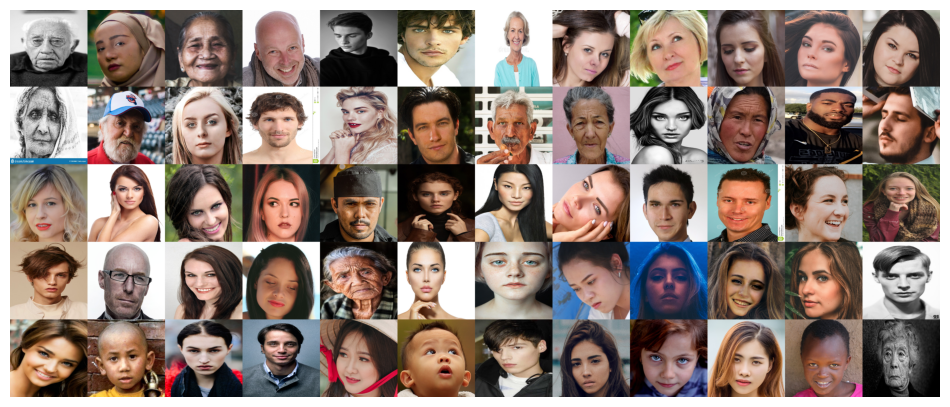

In [4]:
grid = create_image_grid(get_root_dir("data/Humans"), n_rows=5, n_cols=12, cell_size=(350, 350))

# Переводим BGR (OpenCV формат) в RGB (формат Matplotlib)
grid_rgb = cv2.cvtColor(grid, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(12, 6))
plt.imshow(grid_rgb)
plt.axis('off') # Отключаем пиксельные оси
plt.show()

## Класс агрегатора лиц на MediaPipe

In [5]:
class MediaPipeFaceAggregator:
    """
    Агрегатор лиц с использованием MediaPipe Face Landmarker (478 точек)
    Новая версия с mp.tasks API
    """
    
    def __init__(self, model_path: str = "artifacts/pretrained_models/face_landmarker.task",  mean_face_path: Optional[str] = None):
        # Скачиваем модель если её нет
        model_path = get_root_dir(model_path)
        if not os.path.exists(model_path):
            self._download_model(model_path)
        
        # Инициализация детектора MediaPipe Tasks API
        base_options = python.BaseOptions(model_asset_path=model_path)
        options = vision.FaceLandmarkerOptions(
            base_options=base_options,
            output_face_blendshapes=False,
            output_facial_transformation_matrixes=False,
            num_faces=1,
            min_face_detection_confidence=0.5,
            min_tracking_confidence=0.5
        )
        self.detector = vision.FaceLandmarker.create_from_options(options)
        
        # Внутренние хранилища для режима накопления базы данных
        self.all_landmarks = []          # нормализованные (N, 478, 2)
        self.all_original_landmarks = [] # в пикселях (N, 478, 2)
        self.all_features = []           # признаки лиц (N, M)
        
        # Поле для хранения кэшированной статистики
        self._cached_stats = None
        
        # Индексы ключевых точек MediaPipe (внутренний маппинг)
        self.indices = {
            'face_contour': [10, 338, 297, 332, 284, 251, 389, 356, 454, 23],
            'forehead_top': [10, 338, 297],
            'forehead_bottom': [151, 108, 69],
            'left_eyebrow_upper': [70, 63, 105, 66, 107],
            'left_eyebrow_lower': [46, 53, 52, 65, 55],
            'right_eyebrow_upper': [336, 296, 334, 293, 300],
            'right_eyebrow_lower': [282, 283, 285, 295, 282],
            'left_eye': [33, 133, 157, 158, 159, 160, 161, 173],
            'right_eye': [362, 263, 387, 386, 385, 384, 398, 466],
            'nose_tip': [1, 2, 98, 327, 326, 94],
            'nose_bridge': [168, 6, 195, 5, 4],
            'nose_base': [94, 97, 2, 326, 327, 294],
            'mouth_outer': [61, 146, 91, 181, 84, 17, 314, 405, 320, 307, 375, 321],
            'mouth_corners': [61, 291],
            'chin': [152, 148, 149, 150, 136, 172, 138, 135, 169],
            'left_cheekbone': [50, 101, 100, 117, 118],
            'right_cheekbone': [280, 331, 330, 348, 347],
            'jawline': [172, 136, 150, 149, 148, 152, 377, 378, 379, 365],
        }
        
        self.feature_names = [
            'left_eye_width', 'left_eye_height', 'right_eye_width', 'right_eye_height',
            'nose_width', 'nose_height', 'mouth_width', 'mouth_height',
            'left_eyebrow_thickness', 'right_eyebrow_thickness', 'jaw_width',
            'smile_angle', 'face_ratio'
        ]
        
        # Если передан путь к файлу статистики, загружаем его моментально
        if mean_face_path is not None:
            self.load_mean_face(mean_face_path)

    def _download_model(self, model_path: str):
        """Скачивает модель FaceLandmarker"""
        url = "https://storage.googleapis.com/mediapipe-models/face_landmarker/face_landmarker/float16/1/face_landmarker.task"
        print(f"Скачивание модели {model_path}...")
        urllib.request.urlretrieve(url, model_path)
        print("✅ Модель скачана")

    def load_mean_face(self, filepath: str):
        """Загружает готовую предобработанную статистику выборки из JSON"""
        if not os.path.exists(filepath):
            raise FileNotFoundError(f"Файл статистики не найден по пути: {filepath}")
        
        with open(filepath, 'r') as f:
            data = json.load(f)
        
        # Восстанавливаем матрицы в формат numpy массивов
        self._cached_stats = {
            'mean_landmarks': np.array(data['mean_landmarks'], dtype=np.float32),
            'median_landmarks': np.array(data.get('median_landmarks', data['mean_landmarks']), dtype=np.float32),
            'std_landmarks': np.array(data['std_landmarks'], dtype=np.float32),
            'mean_features': np.array(data['mean_features'], dtype=np.float32),
            'median_features': np.array(data.get('median_features', data['mean_features']), dtype=np.float32),
            'std_features': np.array(data['std_features'], dtype=np.float32),
            'feature_names': data['feature_names'],
            'num_samples': data['num_samples']
        }
        self.feature_names = data['feature_names']
        print(f"Статистика базы успешно импортирована из {filepath} (Выборка: {data['num_samples']} лиц). Расчет датасета пропущен!")

    def extract_landmarks_from_image(self, image_path: str) -> np.ndarray:
        """Извлекает 478 точек из изображения через MediaPipe"""
        image = cv2.imread(image_path)
        if image is None:
            raise ValueError(f"Не удалось загрузить изображение: {image_path}")
        
        h, w = image.shape[:2]
        if len(image.shape) == 2:
            image = cv2.cvtColor(image, cv2.COLOR_GRAY2RGB)
        elif image.shape[2] == 4:
            image = cv2.cvtColor(image, cv2.COLOR_BGRA2RGB)
        else: 
            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        mp_image = mp.Image(image_format=mp.ImageFormat.SRGB, data=image)
        result = self.detector.detect(mp_image)
        
        if not result.face_landmarks:
            raise ValueError(f"Лицо не найдено на кадре: {image_path}")
        
        landmarks_pixels = [[int(lm.x * w), int(lm.y * h)] for lm in result.face_landmarks[0]]
        return np.array(landmarks_pixels)
    
    def normalize_landmarks(self, landmarks: np.ndarray) -> np.ndarray:
        """Нормализация landmarks: центрирование и масштабирование относительно зрачков"""
        left_eye = landmarks[33]
        right_eye = landmarks[263]
        
        eye_center = (left_eye + right_eye) / 2
        eye_distance = np.linalg.norm(left_eye - right_eye)
        
        if eye_distance > 0:
            return (landmarks - eye_center) / eye_distance
        return landmarks - eye_center
    
    def _calculate_angle(self, p1: np.ndarray, p2: np.ndarray, p3: np.ndarray) -> float:
        """Вычисляет угол между тремя точками в градусах"""
        v1 = p1 - p2
        v2 = p3 - p2
        cos_angle = np.dot(v1, v2) / (np.linalg.norm(v1) * np.linalg.norm(v2) + 1e-6)
        return float(np.degrees(np.arccos(np.clip(cos_angle, -1, 1))))
    
    def extract_face_features(self, landmarks: np.ndarray, print_output: bool = False) -> Dict[str, float]:
        """Извлекает инвариантные геометрические признаки лица (устойчивые к наклонам)"""
        features = {}
        pts = self.normalize_landmarks(landmarks) if np.max(landmarks) > 10 else landmarks

        face_width = np.linalg.norm(pts[454] - pts[234]) 
        face_height = np.linalg.norm(pts[152] - pts[10]) 

        # Глаза
        features['left_eye_width'] = np.linalg.norm(pts[33] - pts[133]) / face_width
        features['left_eye_height'] = np.linalg.norm(pts[159] - pts[145]) / face_height
        features['right_eye_width'] = np.linalg.norm(pts[263] - pts[362]) / face_width
        features['right_eye_height'] = np.linalg.norm(pts[386] - pts[374]) / face_height

        # Нос
        features['nose_width'] = np.linalg.norm(pts[331] - pts[102]) / face_width
        features['nose_height'] = np.linalg.norm(pts[168] - pts[2]) / face_height

        # Рот (Исправленный FIXED расчет полной толщины губ по внешнему контуру 0 и 17)
        features['mouth_width'] = np.linalg.norm(pts[291] - pts[61]) / face_width
        features['mouth_height'] = np.linalg.norm(pts[0] - pts[17]) / face_height

        # Брови
        features['left_eyebrow_thickness'] = np.linalg.norm(pts[52] - pts[105]) / face_height
        features['right_eyebrow_thickness'] = np.linalg.norm(pts[282] - pts[334]) / face_height

        # Челюсть
        features['jaw_width'] = np.linalg.norm(pts[172] - pts[397]) / face_width

        # Углы и соотношения сторон
        features['smile_angle'] = self._calculate_angle(pts[61], pts[13], pts[291])
        features['face_ratio'] = face_height / face_width

        if print_output:
            for name, val in features.items():
                print(f"{name:25}: {val:.4f}")

        return features
    
    def add_face(self, landmarks: np.ndarray):
        """Добавляет лицо в оперативную базу накопления статистики (сбрасывает кэш JSON)"""
        normalized = self.normalize_landmarks(landmarks)
        features = self.extract_face_features(landmarks)
        
        self.all_landmarks.append(normalized)
        self.all_original_landmarks.append(landmarks)
        self.all_features.append(list(features.values()))
        self._cached_stats = None # Сбрасываем кэш, так как база изменилась

    def compute_mean_face(self) -> Dict:
        """Возвращает кэшированную или динамически рассчитывает статистику выборки"""
        if self._cached_stats is not None:
            return self._cached_stats
            
        if len(self.all_landmarks) == 0:
            raise ValueError("Ошибка: Агрегатор пуст. Загрузите файл через инициализатор или добавьте лица методом .add_face()")
        
        all_landmarks = np.array(self.all_landmarks)
        all_features = np.array(self.all_features)
        
        return {
            'mean_landmarks': np.mean(all_landmarks, axis=0),
            'median_landmarks': np.median(all_landmarks, axis=0),
            'std_landmarks': np.std(all_landmarks, axis=0),
            'mean_features': np.mean(all_features, axis=0),
            'median_features': np.median(all_features, axis=0),
            'std_features': np.std(all_features, axis=0),
            'feature_names': self.feature_names,
            'num_samples': len(self.all_landmarks)
        }
    
    def compare_with_mean(self, image_path: str) -> Dict[str, Dict]:
        """Сравнивает лицо на изображении со средней нормой выборки"""
        landmarks = self.extract_landmarks_from_image(image_path)
        features = self.extract_face_features(landmarks)
        stats = self.compute_mean_face()
        
        deviations = {}
        for i, name in enumerate(stats['feature_names']):
            feature_val = features[name]
            mean_val = stats['mean_features'][i]
            median_val = stats['median_features'][i]
            std_val = stats['std_features'][i]
            
            dev_pct = ((feature_val - mean_val) / mean_val * 100) if abs(mean_val) > 1e-6 else 0
            z_score = (feature_val - mean_val) / (std_val + 1e-6)
            
            deviations[name] = {
                'value': feature_val,
                'mean': mean_val,
                'median': median_val,
                'std': std_val,
                'deviation_percent': dev_pct,
                'z_score': z_score
            }
        return deviations
    
    def get_exaggeration_vector(self, image_path: str, strength: float = 1.0) -> np.ndarray:
        """Вычисляет инвариантный вектор преувеличения с синусоидальной нелинейностью"""
        landmarks = self.extract_landmarks_from_image(image_path)
        normalized = self.normalize_landmarks(landmarks)
        stats = self.compute_mean_face()
        
        # Компенсация наклона головы
        left_eye = normalized[33]
        right_eye = normalized[263]
        angle = np.arctan2(right_eye[1] - left_eye[1], right_eye[0] - left_eye[0])
        
        cos_a, sin_a = np.cos(-angle), np.sin(-angle)
        R_align = np.array([[cos_a, -sin_a], [sin_a, cos_a]])
        
        current_center = (left_eye + right_eye) / 2
        aligned_current = np.dot(normalized - current_center, R_align.T)
        
        mean_left = stats['mean_landmarks'][33]
        mean_right = stats['mean_landmarks'][263]
        mean_center = (mean_left + mean_right) / 2
        aligned_mean = stats['mean_landmarks'] - mean_center
        
        deviation = aligned_current - aligned_mean
        max_expected_dev = np.max(stats.get('std_landmarks', 0.5)) * 2.0
        
        normalized_dev = np.clip(deviation / max_expected_dev, -1.0, 1.0)
        sinusoidal_dev = np.sin(normalized_dev * (np.pi / 2.0))
        
        exaggeration_aligned = sinusoidal_dev * max_expected_dev * strength
        
        cos_b, sin_b = np.cos(angle), np.sin(angle)
        R_back = np.array([[cos_b, -sin_b], [sin_b, cos_b]])
        exaggeration = np.dot(exaggeration_aligned, R_back.T)
        
        # Взвешивание анатомических зон важности
        importance_weights = np.ones(478)
        for idx in self.indices['left_eye'] + self.indices['right_eye']:
            importance_weights[idx] = 2.5  
        for idx in self.indices['nose_tip'] + self.indices['nose_base'] + self.indices['nose_bridge']:
            importance_weights[idx] = 2.2  
        for idx in self.indices['mouth_outer']:
            importance_weights[idx] = 1.8  
        for idx in self.indices['face_contour']:
            importance_weights[idx] = 0.4  
                
        return exaggeration * importance_weights[:, np.newaxis]
    
    def save_mean_face(self, filepath: str):
        """Сохраняет рассчитанную текущую статистику базы данных в файл JSON"""
        stats = self.compute_mean_face()
        data = {
            'mean_landmarks': stats['mean_landmarks'].tolist(),
            'median_landmarks': stats['median_landmarks'].tolist(),
            'std_landmarks': stats['std_landmarks'].tolist(),
            'mean_features': stats['mean_features'].tolist(),
            'median_features': stats['median_features'].tolist(),
            'std_features': stats['std_features'].tolist(),
            'feature_names': stats['feature_names'],
            'num_samples': stats['num_samples']
        }
        with open(filepath, 'w') as f:
            json.dump(data, f, indent=2)
        print(f"✅ Среднее лицо успешно сохранено в файл: {filepath}")
    
    def warp_face(self, image_path: str, caricature_params: Dict, target_size: Tuple[int, int] = (512, 512)) -> np.ndarray:
        """Выполняет анатомически стабильный IDW-варпинг изображения методом Шепарда"""
        ex_vector = caricature_params['exaggeration_vector']
        sigma_factor = caricature_params.get('sigma_factor', 0.35)
        grid_step = caricature_params.get('grid_step', 1)
        
        image_bgr = cv2.imread(image_path)
        if image_bgr is None:
            raise ValueError(f"Не удалось загрузить изображение: {image_path}")
        image_rgb = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)
        h, w = image_rgb.shape[:2]
        
        orig_landmarks = self.extract_landmarks_from_image(image_path)
        ex_vector_np = np.array(ex_vector, dtype=np.float32)
        
        left_eye = orig_landmarks[33]
        right_eye = orig_landmarks[263]
        eye_distance = max(np.linalg.norm(left_eye - right_eye), 1e-6)
        
        pixel_offsets = ex_vector_np * eye_distance
        
        # Стабилизация фона по периметру
        edge_points = np.array([
            [0, 0], [w // 2, 0], [w - 1, 0],
            [0, h // 2],         [w - 1, h // 2],
            [0, h - 1], [w // 2, h - 1], [w - 1, h - 1]
        ], dtype=np.float32)
        src_pts = np.vstack([orig_landmarks, edge_points]).astype(np.float32)

        map_x, map_y = np.meshgrid(np.arange(w, dtype=np.float32), np.arange(h, dtype=np.float32))
        total_dx = np.zeros_like(map_x)
        total_dy = np.zeros_like(map_y)
        total_weight = np.zeros_like(map_x)
        
        sparse_indices = list(range(0, 478, grid_step))
        sigma_sq = 2 * (eye_distance * sigma_factor) ** 2
        
        for idx in sparse_indices:
            sx, sy = src_pts[idx]
            ox, oy = pixel_offsets[idx] if idx < 478 else (0, 0)
            
            r_sq = (map_x - sx) ** 2 + (map_y - sy) ** 2
            weight = np.exp(-r_sq / sigma_sq)
            
            total_dx += ox * weight
            total_dy += oy * weight
            total_weight += weight

        if caricature_params.get('background_stabilization', True):
            for edge_pt in edge_points:
                ex, ey = edge_pt
                r_sq = (map_x - ex) ** 2 + (map_y - ey) ** 2
                edge_weight = 1.0 / (r_sq + 1e-6) 
                total_weight += edge_weight

        total_weight = np.maximum(total_weight, 1e-6)
        dx = total_dx / total_weight
        dy = total_dy / total_weight

        warped_map_x = np.clip(map_x - dx, 0, w - 1)
        warped_map_y = np.clip(map_y - dy, 0, h - 1)
        
        warped_img = cv2.remap(image_rgb, warped_map_x, warped_map_y, interpolation=cv2.INTER_LINEAR, borderMode=cv2.BORDER_REFLECT)
        
        if warped_img.shape[:2] != target_size:
            warped_img = cv2.resize(warped_img, target_size, interpolation=cv2.INTER_AREA)
            
        return warped_img

## Функции визуализации

In [6]:
def visualize_mediapipe_analysis(image_path: str, 
                                  landmarks: np.ndarray,
                                  deviations: Dict[str, Dict],
                                  exaggeration: np.ndarray = None,
                                  save_path: str = None):
    """
    Визуализация лица с MediaPipe разметкой и подписями отклонений
    """
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    h, w = image.shape[:2]
    
    fig, axes = plt.subplots(1, 2 if exaggeration is not None else 1, 
                             figsize=(16, 8) if exaggeration is not None else (12, 8))
    
    if exaggeration is not None:
        ax1, ax2 = axes
    else:
        ax1 = axes
        ax2 = None
    
    # Исходное лицо
    ax1.imshow(image)
    ax1.scatter(landmarks[:, 0], landmarks[:, 1], c='lime', s=8, alpha=0.5)
    ax1.set_title('MediaPipe Face Mesh (468 точек)', fontsize=12)
    ax1.axis('off')
    
    # Находим топ-5 отклонений
    deviations_pct = {name: data['deviation_percent'] for name, data in deviations.items()}
    sorted_deviations = sorted(deviations_pct.items(), key=lambda x: abs(x[1]), reverse=True)[:6]
    
    # Позиции для подписей
    label_positions = {
        'forehead_height': landmarks[10],
        'forehead_width': landmarks[297],
        'left_eyebrow_thickness': landmarks[105],
        'right_eyebrow_thickness': landmarks[334],
        'left_eyebrow_angle': landmarks[105],
        'right_eyebrow_angle': landmarks[334],
        'left_eye_width': landmarks[33],
        'right_eye_width': landmarks[263],
        'nose_height': landmarks[1],
        'nose_width': landmarks[94],
        'mouth_width': landmarks[61],
        'mouth_height': landmarks[13],
        'smile_angle': landmarks[61],
        'chin_height': landmarks[152],
        'jaw_width': landmarks[172],
        'cheekbone_width': landmarks[50],
        'cheekbone_height': landmarks[50],
        'eye_distance': (landmarks[33] + landmarks[263]) / 2,
        'face_ratio': landmarks[152],
        'eye_to_mouth_ratio': landmarks[13],
    }
    
    for idx, (feature_name, deviation) in enumerate(sorted_deviations):
        matching_key = None
        for key in label_positions.keys():
            if key in feature_name:
                matching_key = key
                break
        
        if matching_key:
            pos = label_positions[matching_key]
        else:
            pos = landmarks[152]
        
        color = 'red' if deviation > 0 else 'blue'
        direction = '↑' if deviation > 0 else '↓'
        text = f"{direction} {feature_name}: {abs(deviation):.1f}%"
        
        text_x = pos[0] + 15
        text_y = pos[1] - 20 - idx * 25
        
        if text_x > w - 20:
            text_x = pos[0] - 200
        if text_y < 30:
            text_y = pos[1] + 20 + idx * 25
        
        ax1.annotate(text, xy=(pos[0], pos[1]), xytext=(text_x, text_y),
                   fontsize=8, color=color, weight='bold',
                   bbox=dict(boxstyle="round,pad=0.3", facecolor='white', edgecolor=color, alpha=0.85),
                   arrowprops=dict(arrowstyle='->', color=color, lw=1))
    
    # Шарж
    if exaggeration is not None:
        exaggerated_landmarks = landmarks + exaggeration
        
        ax2.imshow(image)
        ax2.scatter(exaggerated_landmarks[:, 0], exaggerated_landmarks[:, 1], 
                   c='orange', s=8, alpha=0.5)
        ax2.set_title(f'Exaggerated Face (strength={np.mean(np.abs(exaggeration)):.2f})', fontsize=12)
        ax2.axis('off')
        
        for i in range(0, len(landmarks), 30):
            ax2.arrow(landmarks[i, 0], landmarks[i, 1],
                     exaggeration[i, 0], exaggeration[i, 1],
                     color='red', alpha=0.3, width=0.5)
    
    plt.suptitle('Анализ лица для генерации шаржа', fontsize=14, weight='bold')
    plt.tight_layout()
    
    if save_path:
        plt.savefig(save_path, dpi=150, bbox_inches='tight')
        print(f"Визуализация сохранена в {save_path}")
    
    plt.show()
    return fig

## Создание агрегатора

In [7]:
def get_canonical_groups():
    """
    Генерирует группы на основе официальных констант MediaPipe Face Mesh.
    Это гарантирует 100% точность индексов.
    """
    
    # Вспомогательная функция для превращения набора связей в список уникальных точек
    def get_indices(connections):
        indices = set()
        for connection in connections:
            indices.add(connection[0])
            indices.add(connection[1])
        return list(indices)

    groups = {
        # Основные контуры (из FACEMESH_CONTOURS)
        'Губы': get_indices(mp_face_mesh.FACEMESH_LIPS),
        'Левый глаз': get_indices(mp_face_mesh.FACEMESH_LEFT_EYE),
        'Левая бровь': get_indices(mp_face_mesh.FACEMESH_LEFT_EYEBROW),
        'Правый глаз': get_indices(mp_face_mesh.FACEMESH_RIGHT_EYE),
        'Правая бровь': get_indices(mp_face_mesh.FACEMESH_RIGHT_EYEBROW),
        'Овал лица': get_indices(mp_face_mesh.FACEMESH_FACE_OVAL),
        
        # Детализация (из FACEMESH_TESSELATION - это вся сетка)
        # Здесь мы добавляем нос и челюсть через фиксированные индексы, 
        # так как в connections они не выделены отдельными именованными константами
        'Нос': [
            1, 2, 98, 327, 326, 97, 4, 5, 195, 197, # центр
            102, 129, 203, 209, 429, 423, 358, 331    # крылья
        ],
        'Челюсть': [58, 172, 136, 150, 149, 148, 152, 377, 378, 379, 365, 397, 288],
        # 'Переносица': [168, 6, 197, 195, 5]
    }

    # Ирисы 
    try:
        groups['Зрачки'] = get_indices(mp_face_mesh.FACEMESH_IRISES)
    except AttributeError:
        pass

    return groups

In [8]:
groups = get_canonical_groups()

mean_face_path = get_root_dir("configs/mean_face.json")
if os.path.exists(mean_face_path):
    aggregator = MediaPipeFaceAggregator(mean_face_path=mean_face_path)
else:
    aggregator = MediaPipeFaceAggregator()
    data_path = 'data/Humans'
    data_path = get_root_dir(data_path)
    for img in tqdm(os.listdir(data_path)):
        if img.endswith(('.jpg', '.png', '.jpeg')):
            image_path = os.path.join(data_path, img)
            try:
                landmarks = aggregator.extract_landmarks_from_image(image_path)
                aggregator.add_face(landmarks)
            except ValueError:
                pass

Статистика базы успешно импортирована из /home/ian/Desktop/ptn/mirea/aie/project/configs/mean_face.json (Выборка: 3132 лиц). Расчет датасета пропущен!


I0000 00:00:1780061946.356366   43251 gl_context_egl.cc:85] Successfully initialized EGL. Major : 1 Minor: 5
I0000 00:00:1780061946.359762   43343 gl_context.cc:357] GL version: 3.2 (OpenGL ES 3.2 Mesa 24.2.8-1ubuntu1~24.04.1), renderer: AMD Radeon Graphics (radeonsi, gfx1103_r1, LLVM 19.1.1, DRM 3.64, 6.17.0-23-generic)
W0000 00:00:1780061946.360322   43251 face_landmarker_graph.cc:174] Sets FaceBlendshapesGraph acceleration to xnnpack by default.
INFO: Created TensorFlow Lite XNNPACK delegate for CPU.


In [9]:
# Вычисляем статистику
stats = aggregator.compute_mean_face()

print(f"Статистика по выборке:")
print(f"   Всего лиц: {stats['num_samples']}")
print(f"   Количество признаков: {len(stats['feature_names'])}")
print(f"\nПризнаки и средние значения:")
for i, name in enumerate(stats['feature_names']):
    if 360 > stats['mean_features'][i] > 0 and 360 > stats['std_features'][i] > 0:
        print(f"✅ {name:25s}: {stats['mean_features'][i]:.4f} ± {stats['std_features'][i]:.4f}")
    else:
        print(f"❌ {name:25s}: {stats['mean_features'][i]:.4f} ± {stats['std_features'][i]:.4f}")

aggregator.save_mean_face(get_root_dir("configs/mean_face.json"))

Статистика по выборке:
   Всего лиц: 3132
   Количество признаков: 13

Признаки и средние значения:
✅ left_eye_width           : 0.2021 ± 0.0217
✅ left_eye_height          : 0.0570 ± 0.0131
✅ right_eye_width          : 0.2039 ± 0.0228
✅ right_eye_height         : 0.0563 ± 0.0130
✅ nose_width               : 0.2944 ± 0.0239
✅ nose_height              : 0.3074 ± 0.0196
✅ mouth_width              : 0.3832 ± 0.0507
✅ mouth_height             : 0.1277 ± 0.0343
✅ left_eyebrow_thickness   : 0.0351 ± 0.0035
✅ right_eyebrow_thickness  : 0.0346 ± 0.0035
✅ jaw_width                : 0.8043 ± 0.0282
✅ smile_angle              : 166.6297 ± 13.6271
✅ face_ratio               : 1.1756 ± 0.1085
✅ Среднее лицо успешно сохранено в файл: /home/ian/Desktop/ptn/mirea/aie/project/configs/mean_face.json


In [10]:
def plot_mean_face(aggregator):
    """
    Математически корректная визуализация среднего лица.
    Использует встроенные топологические связи MediaPipe для отрисовки контуров.
    """
    # 1. Получаем средние координаты из агрегатора
    stats = aggregator.compute_mean_face()
    mean_pts = np.array(stats['mean_landmarks'])  # Массив (478, 2)
    
    fig, ax = plt.subplots(figsize=(9, 11))
    ax.set_facecolor('#111111')  # Глубокий темный фон
    
    # 2. Сначала отрисуем ВСЕ 478 точек как легкое базовое облако (subtle glow)
    ax.scatter(mean_pts[:, 0], mean_pts[:, 1], c='#333333', s=5, alpha=0.5, edgecolors='none')
    
    # 3. Каршафт связей 
    connection_groups = {
        'Овал лица': (mp_face_mesh.FACEMESH_FACE_OVAL, '#666666', 1.5),
        'Левый глаз': (mp_face_mesh.FACEMESH_LEFT_EYE, '#00ffcc', 2.0),
        'Левая бровь': (mp_face_mesh.FACEMESH_LEFT_EYEBROW, '#ffcc00', 1.8),
        'Правый глаз': (mp_face_mesh.FACEMESH_RIGHT_EYE, '#00ffcc', 2.0),
        'Правая бровь': (mp_face_mesh.FACEMESH_RIGHT_EYEBROW, '#ffcc00', 1.8),
        'Контур губ': (mp_face_mesh.FACEMESH_LIPS, '#ff3333', 2.0),
        'Нос': (mp_face_mesh.FACEMESH_NOSE, '#ff007f', 1.8)
    }
    
    # Набор для отслеживания легенды, чтобы не дублировать линии в списке
    rendered_labels = set()
    
    # 4. Отрисовываем линии строго по парам связей MediaPipe (от точки А к точке Б)
    for name, (connections, color, linewidth) in connection_groups.items():
        for connection in connections:
            start_idx = connection[0]
            end_idx = connection[1]
            
            # Берем координаты начала и конца линии
            x_coords = [mean_pts[start_idx, 0], mean_pts[end_idx, 0]]
            y_coords = [mean_pts[start_idx, 1], mean_pts[end_idx, 1]]
            
            # Добавляем label только для первого отрезка в группе, чтобы легенда была чистой
            label = name if name not in rendered_labels else ""
            rendered_labels.add(name)
            
            ax.plot(x_coords, y_coords, c=color, linewidth=linewidth, alpha=0.8, label=label)
            
            # Подсвечиваем сами узловые точки контура
            ax.scatter(x_coords, y_coords, c=color, s=12, alpha=0.6, edgecolors='none')

    # Настройка отображения
    ax.set_title("Анатомическая карта среднего лица", color='black', fontsize=14, pad=20)
    ax.invert_yaxis()  # Инверсия Y для соответствия пиксельной сетке камеры/изображения
    ax.axis('off')
    
    # Выводим красивую аккуратную легенду
    plt.legend(loc='upper right', bbox_to_anchor=(1.25, 1), facecolor='#222222', edgecolor='#444444', labelcolor='white')
    plt.tight_layout()
    plt.savefig(get_root_dir('artifacts/visualisation/mean_face.png'), dpi=150, bbox_inches='tight')
    plt.show()

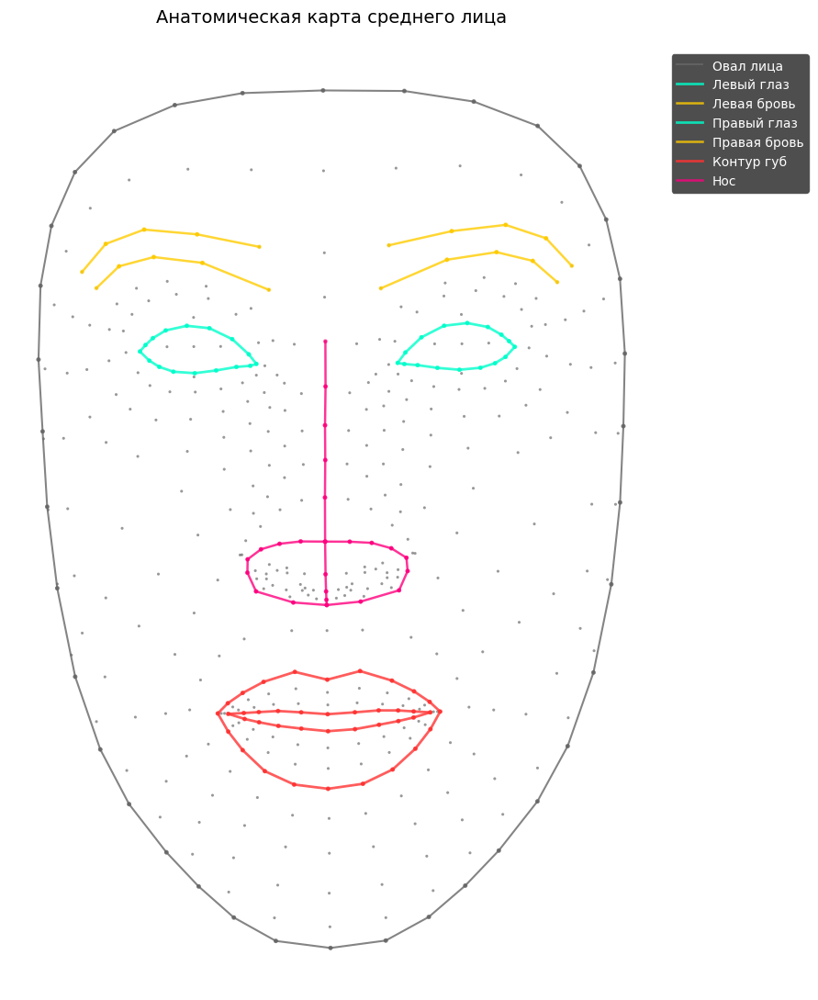

In [11]:
plot_mean_face(aggregator)

## Вектора преувеличения

In [12]:
def get_caricature_parameters(aggregator, groups: Dict[str, List[int]], img_path: str, strength: float = 1.3) -> Dict:
    """
    Генерирует полный набор параметров для создания карикатуры.
    Автоматически рассчитывает внутренний вектор преувеличения MediaPipe.
    """
    # Вычисляем вектор преувеличения через встроенный метод агрегатора
    ex_vector = aggregator.get_exaggeration_vector(img_path, strength=strength)
    
    return {
        'exaggeration_vector': ex_vector,
        'groups': groups,
        'sigma_factor': 0.35, # Плавность затухания деформации (0.6 - 0.8)
        'grid_step': 1, # Шаг прореживания сетки (1 - идеально плавно, 4 - быстро)
        'background_stabilization': True
    }

## Анализ лиц

In [13]:
def visualize_landmark_groups(image_path: str, landmarks: np.ndarray, 
                             aggregator: MediaPipeFaceAggregator,
                             save_path: str = None):
    """
    Визуализация с группировкой точек
    """
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    
    fig, axes = plt.subplots(1, 2, figsize=(18, 9))
    
    # Левый график: точки по группам
    ax1 = axes[0]
    ax1.imshow(image)
    
    # Фон - все точки
    ax1.scatter(landmarks[:, 0], landmarks[:, 1], c='lightgray', s=2, alpha=0.2)
    
    colors = {     
        'Губы': 'purple',
        'Левый глаз': 'orange',
        'Левая бровь': 'lime',
        'Правый глаз': 'red',
        'Правая бровь': 'magenta',
        'Овал лица': 'brown',
        'Зрачки': 'green',
        'Нос': 'yellow',
        'Челюсть': 'blue',
        # 'Переносица': 'pink'
    }
    
    for name, indices in groups.items():
        ax1.scatter(landmarks[indices, 0], landmarks[indices, 1], 
                   c=colors[name], s=12, alpha=0.8, label=name)
    
    ax1.legend(loc='upper right', fontsize=9)
    ax1.set_title(f'MediaPipe Face Mesh - {len(landmarks)} точек', fontsize=12)
    ax1.axis('off')
    
    # Правый график: статистика
    ax2 = axes[1]
    ax2.axis('off')

    deviations = aggregator.compare_with_mean(image_path)
    
    # Создаём таблицу
    table_data = []
    for i, name in enumerate(aggregator.feature_names):  
        
        table_data.append([
            name, 
            f"{deviations[name]['value']:.3f}", 
            f"{deviations[name]['mean']:.3f}", 
            f"{deviations[name]['median']:.3f}", 
            f"{deviations[name]['deviation_percent']:+.1f}%"
        ])
    
    # Рисуем таблицу
    table = ax2.table(cellText=table_data,
                     colLabels=['Признак', 'Текущее', 'Среднее', 'Медиана', 'Отклонение'],
                     loc='center',
                     colWidths=[0.25, 0.15, 0.15, 0.15, 0.2])
    table.auto_set_font_size(False)
    table.set_fontsize(9)
    table.scale(1.2, 1.5)
    
    # Цветовая подсветка отклонений
    for i, row in enumerate(table_data):
        dev = float(row[4].replace('%', '').replace('+', ''))
        if dev > 15:
            table[(i+1, 4)].set_facecolor('#ccffcc')
        elif dev < -15:
            table[(i+1, 4)].set_facecolor('#ffcccc')  
    
    ax2.set_title('Отклонения признаков', fontsize=12, weight='bold')
    
    plt.suptitle(f'Анализ лица: {os.path.basename(image_path)}', fontsize=14)
    plt.tight_layout()
    
    if save_path:
        plt.savefig(save_path, dpi=150, bbox_inches='tight')
    plt.show()

    mapping = {     
        'mouth_width': 'Ширина рта',
        'mouth_height': 'Высота рта',
        'left_eyebrow_thickness': 'Толщина левой брови',
        'right_eyebrow_thickness': 'Толщина правой брови',
        'jaw_width': 'Ширина челюсти',
        'smile_angle': 'Угол улыбки',
        'face_ratio': 'Радиус лица',
        'nose_width': 'Ширина носа',
        'nose_height': 'Высота носа',
        'right_eye_height': 'Высота правого глаза',
        'right_eye_width': 'Ширина правого глаза',
        'left_eye_height': 'Высота левого глаза',
        'left_eye_width': 'Ширина левого глаза',
        # 'Переносица': 'pink'
    }

    print('Топ-3 экстраординарных признака')
    sorted_features = sorted(
        table_data, 
        key=lambda row: abs(float(row[4].replace('%', '').replace('+', '').replace('-', ''))), 
        reverse=True
    )
    
    for rank, row in enumerate(sorted_features[:3], start=1):
        name, current, mean, _, dev_str = row
        print(f"  {rank}. {mapping[name]:<25} ➔ Отклонение: {dev_str:<8} (Текущее: {current} | Норма: {mean})")

    return fig

In [14]:
ex_vectors = {}

def vis_pipeline(img_path: str, strength: float, save: bool) -> None:
    landmarks = aggregator.extract_landmarks_from_image(img_path)
    visualize_landmark_groups(
        img_path, landmarks, aggregator,
        save_path= get_root_dir('artifacts/visualisation/face_analysis.png')
    )
    params = get_caricature_parameters(aggregator, groups, img_path, strength=strength)
    ex_vectors[img_path] = params['exaggeration_vector'].tolist()
    print(f"Полученный вектор преувеличения:\n{params['exaggeration_vector'][:5]}...")

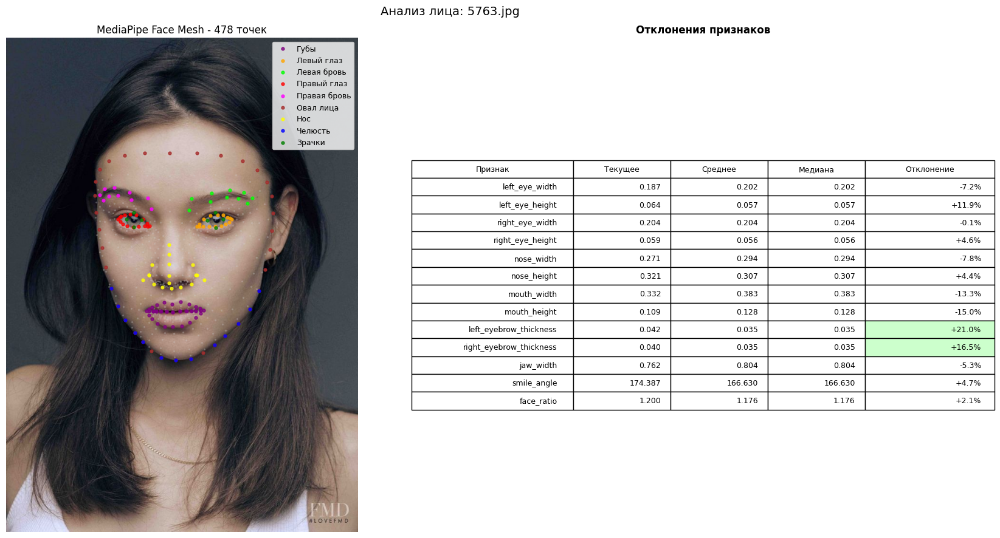

Топ-3 экстраординарных признака
  1. Толщина левой брови       ➔ Отклонение: +21.0%   (Текущее: 0.042 | Норма: 0.035)
  2. Толщина правой брови      ➔ Отклонение: +16.5%   (Текущее: 0.040 | Норма: 0.035)
  3. Высота рта                ➔ Отклонение: -15.0%   (Текущее: 0.109 | Норма: 0.128)
Полученный вектор преувеличения:
[[-0.04726857  0.14637999]
 [-0.21564309  0.47436293]
 [-0.14398527  0.38486328]
 [-0.09210151  0.1717224 ]
 [-0.23312214  0.49848688]]...


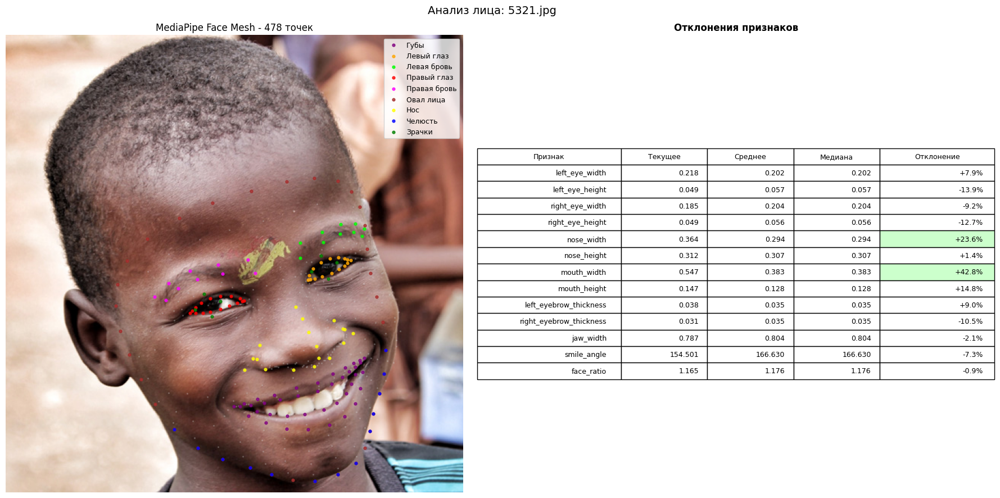

Топ-3 экстраординарных признака
  1. Ширина рта                ➔ Отклонение: +42.8%   (Текущее: 0.547 | Норма: 0.383)
  2. Ширина носа               ➔ Отклонение: +23.6%   (Текущее: 0.364 | Норма: 0.294)
  3. Высота рта                ➔ Отклонение: +14.8%   (Текущее: 0.147 | Норма: 0.128)
Полученный вектор преувеличения:
[[ 0.15530319 -0.20208628]
 [ 0.72045899 -0.13242296]
 [ 0.47936694 -0.19358611]
 [ 0.26050548 -0.07950928]
 [ 0.7600255  -0.14662487]]...


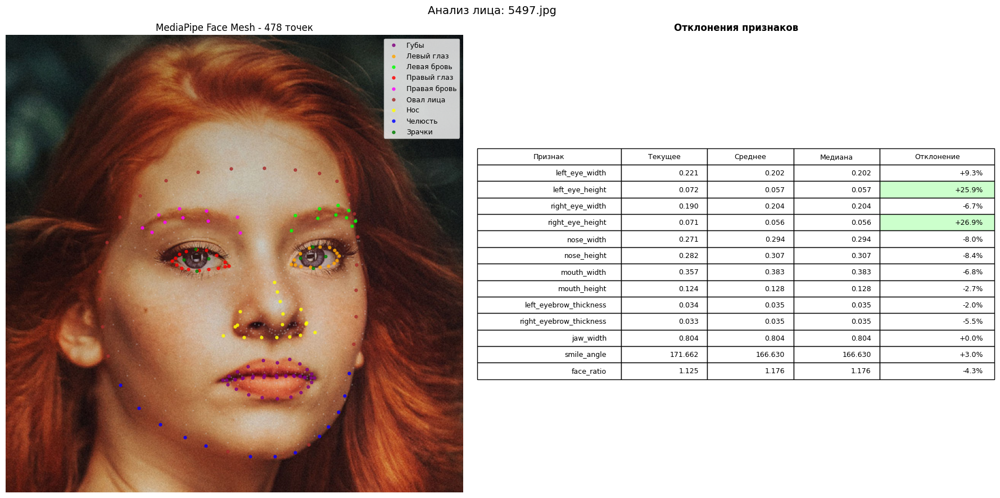

Топ-3 экстраординарных признака
  1. Высота правого глаза      ➔ Отклонение: +26.9%   (Текущее: 0.071 | Норма: 0.056)
  2. Высота левого глаза       ➔ Отклонение: +25.9%   (Текущее: 0.072 | Норма: 0.057)
  3. Ширина левого глаза       ➔ Отклонение: +9.3%    (Текущее: 0.221 | Норма: 0.202)
Полученный вектор преувеличения:
[[ 0.24916221 -0.15716327]
 [ 0.73128265 -0.38657628]
 [ 0.55675245 -0.31947981]
 [ 0.28829204 -0.08256571]
 [ 0.76675481 -0.3651109 ]]...


In [15]:
# Сила преувеличения
STRENGTH = 1.5

dir = get_root_dir('data/demo/Humans/')
files = [f for f in os.listdir(dir) if os.path.isfile(os.path.join(dir, f))]
random_files = random.sample(files, 3)
save = True

for i in random_files:
    p = f'{dir}{i}'
    vis_pipeline(p, STRENGTH, save)
    save = False

## Варпинг

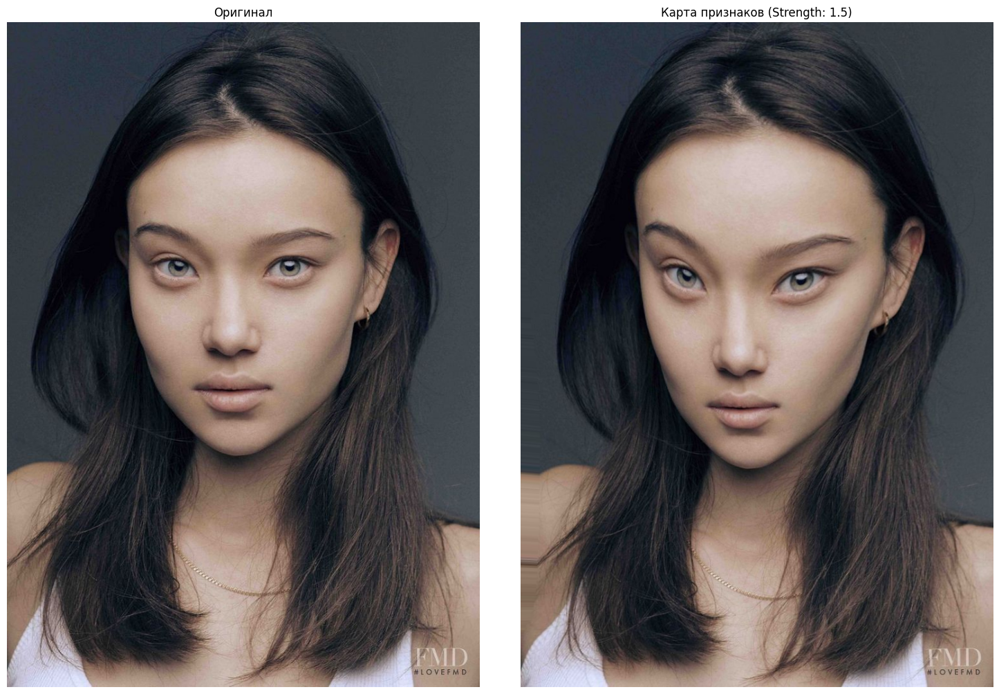

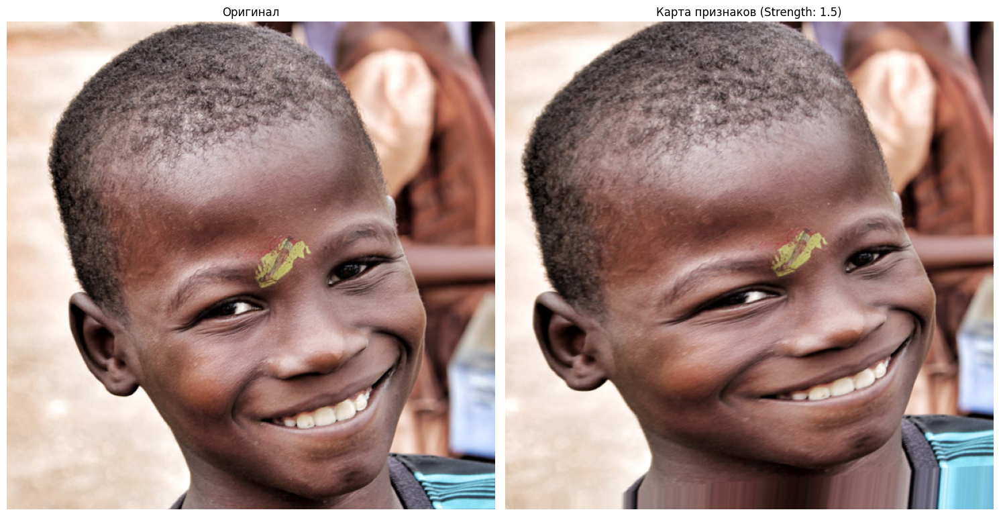

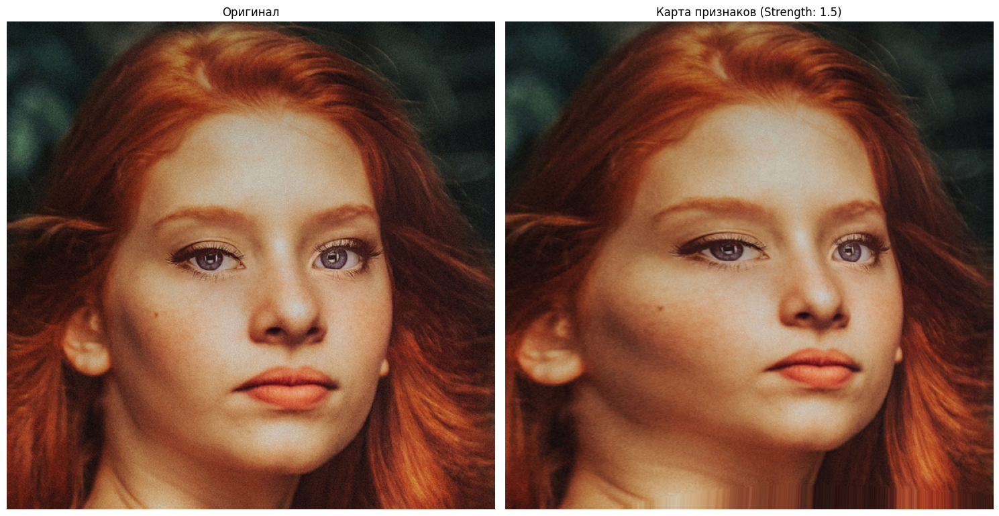

In [16]:
saved = False
for path, vec in ex_vectors.items():
    image = cv2.imread(path)
    params = get_caricature_parameters(aggregator, groups, path, strength=STRENGTH)
    warped_img = aggregator.warp_face(path, caricature_params=params, target_size=image.shape[:-1])

    # 3. Сохраняем и отправляем в Stable Diffusion (img2img / ControlNet)
    fig, axes = plt.subplots(1, 2, figsize=(15, 10))
    
    # Левый график: точки по группам
    ax1, ax2 = axes

    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    ax1.imshow(image)
    ax1.axis('off')
    ax1.set_title("Оригинал")
    # warped_img = cv2.cvtColor(warped_img, cv2.COLOR_BGR2RGB)
    ax2.imshow(warped_img)
    ax2.axis('off')
    ax2.set_title(f"Карта признаков (Strength: {STRENGTH})")
    plt.tight_layout()

    if not saved:
        plt.savefig(get_root_dir('artifacts/visualisation/warp.png'), dpi=150, bbox_inches='tight')
        saved = True